# Star Forming Regions 

A number of White Papers/Science Pitches highlighted a range of science that can be done through a Roman survey of Star Forming Regions (SFRs) in the Galactic Plane.  

The purpose of this notebook is to explore the specific regions requested. 

In [1]:
from os import path
import json
import config_utils
import regions
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table, Column
from mw_plot import MWSkyMap, MWSkyMapBokeh
from astropy_healpix import HEALPix
from astropy import units as u
from astropy.coordinates import Galactic, TETE, SkyCoord
import healpy as hp

# Configure path to local repository
root_dir = '/Users/rstreet/software/rgps'

# HEALpixel grid resolution
NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
PIXAREA = hp.nside2pixarea(NSIDE, degrees=True)

The rgps_survey_regions.json file contains the database of the regions requested for survey by the community.  Within this file, science cases area categorized so that we can select those cases relating to SFRs and star clusters.  Note that we also use the "ready_to_use" keyword to select those science cases that are fully defined; a few are still awaiting feedback from their authors in response to questions. 

In [2]:
config = config_utils.read_config(path.join(root_dir, 'config', 'rgps_survey_regions.json'))

In [3]:
sfr_science = {}

# Select from the set of science cases those relating to SFR science
for author, info in config.items():
    if info['ready_for_use'] and 'SFR' in info['category']:
        sfr_science[author] = info

print(str(len(sfr_science)) + ' science cases relate to SFR science.  Author names:')
for author, info in sfr_science.items():
    print(author + ': ' + info['comment'])

4 science cases relate to SFR science.  Author names:
Werner: Star Forming Regions; inc Orion SFR, Rho Ophiuchi SFR, Taurus SFR
Lim1: Young Stellar Object spectroscopy
De_Furio: Star forming regions; Taurus; Sco-Cen; Orion Nebula Cluster; Orion molecular Cloud (TEMPO region), Chamaeleon I
Lim2: Triggered star formation


The most straight-forward way to visualize the requested regions - and highlight regions requested by multiple science cases - is to combine the requested regions in a sky map.

In [4]:
# Extracting the set of regions from the set of science cases 
requested_regions = regions.extract_requested_regions(sfr_science)
desired_regions = regions.calc_healpixel_regions(requested_regions)
desired_regions

{'F087': [],
 'F106': [],
 'F129': [<regions.CelestialRegion at 0x10c7a2bd0>,
 'F158': [<regions.CelestialRegion at 0x10c896fd0>,
 'F184': [<regions.CelestialRegion at 0x10c8729d0>,
 'F213': [<regions.CelestialRegion at 0x10c87c810>,
 'F146': [],
 'G150': [<regions.CelestialRegion at 0x10c917690>],
 'P127': []}

In [5]:
for optic, regions_for_optic in desired_regions.items():
    if len(regions_for_optic) > 0:
        print(optic + ' has region(s):')
        for r in regions_for_optic:
            print(r.summary())
    else:
        print(optic + ' has no requested regions')

F087 has no requested regions
F106 has no requested regions
F129 has region(s):
Lim1: l_center=60.0 deg, b_center=0.0 deg n_pixels=74 F129
De_Furio: l_center=174.1331 deg, b_center=-13.4523 deg n_pixels=149 F129
De_Furio: l_center=351.3857, b_center=18.9749 n_pixels=239 F129
De_Furio: l_center=209.0666, b_center=-19.4873 n_pixels=243 F129
De_Furio: l_center=208.821, b_center=-19.261 n_pixels=4 F129
De_Furio: l_center=297.1559, b_center=-15.6172 n_pixels=10 F129
De_Furio: l_center=264.5, b_center=1.7 n_pixels=4 F129
De_Furio: l_center=78.5, b_center=2.7 n_pixels=4 F129
De_Furio: l_center=356.5, b_center=-0.7 n_pixels=4 F129
De_Furio: l_center=85.2, b_center=-0.9 n_pixels=4 F129
De_Furio: l_center=266.5, b_center=-3.6 n_pixels=4 F129
De_Furio: l_center=78.9, b_center=0.7 n_pixels=3 F129
De_Furio: l_center=245.2, b_center=-3.6 n_pixels=4 F129
De_Furio: l_center=261.4, b_center=1.0 n_pixels=3 F129
De_Furio: l_center=280.7, b_center=4.3 n_pixels=4 F129
De_Furio: l_center=181.4, b_center=-2.

In [6]:
# Building combined maps of all HEALpixels requested by all science cases in each filter
combined_regions = regions.combine_regions_per_filter(desired_regions)

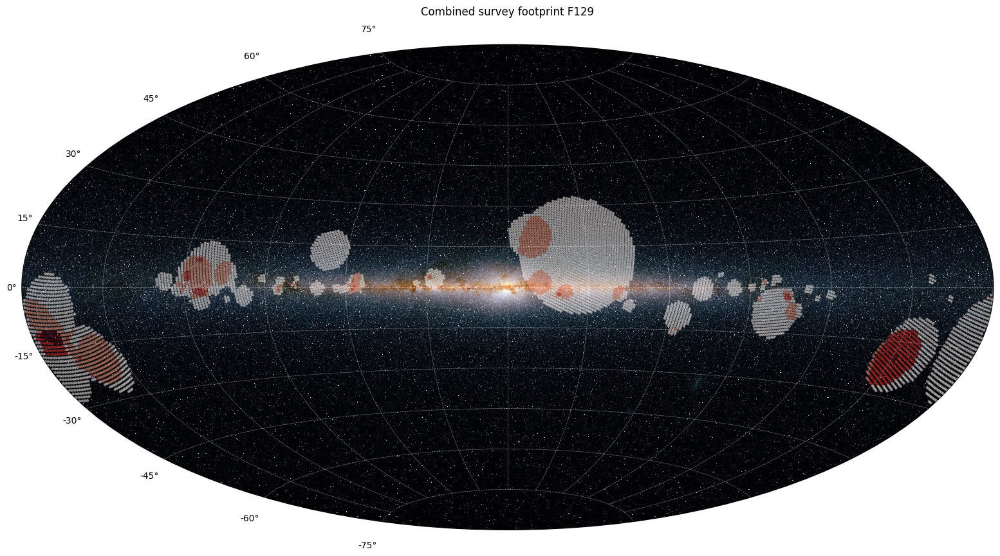

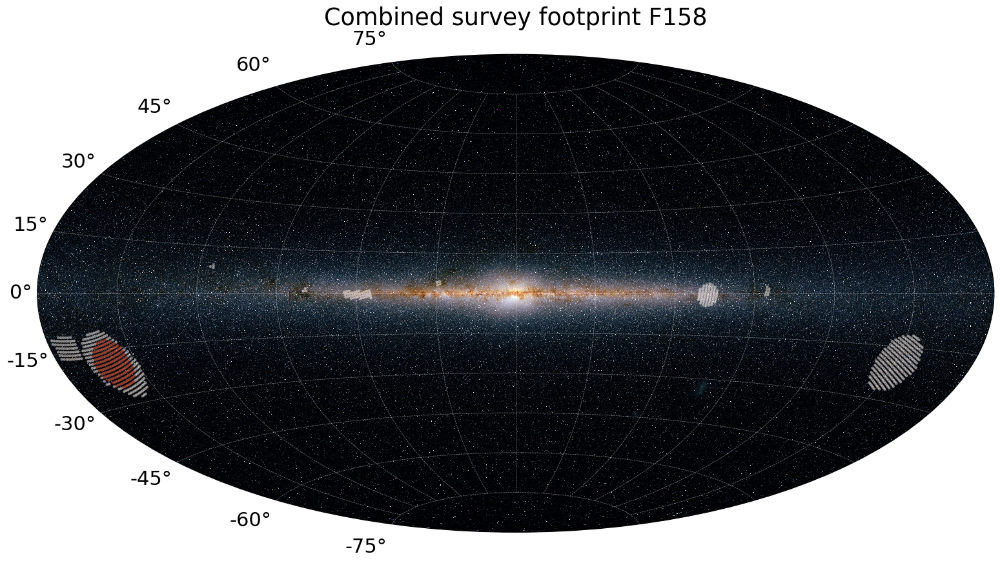

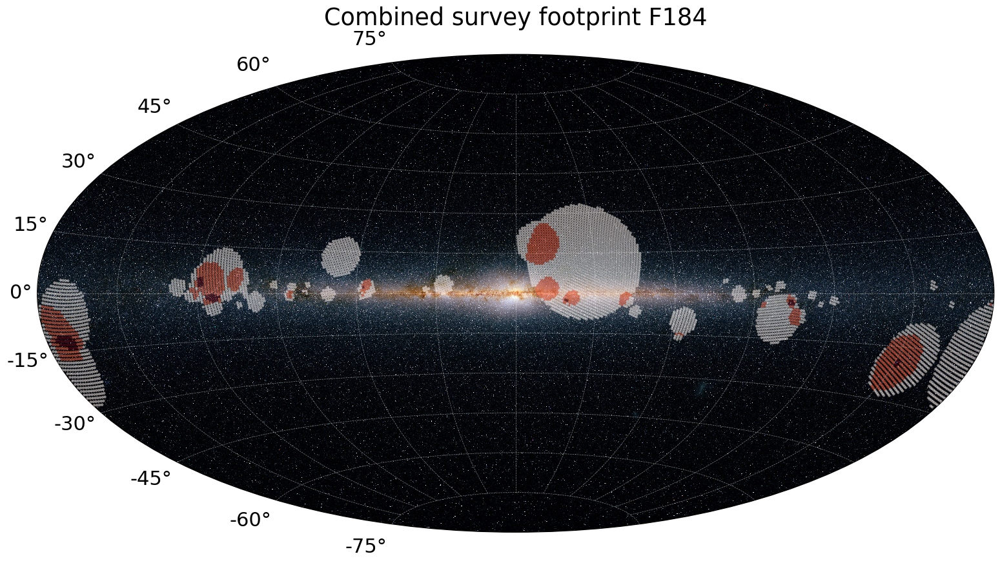

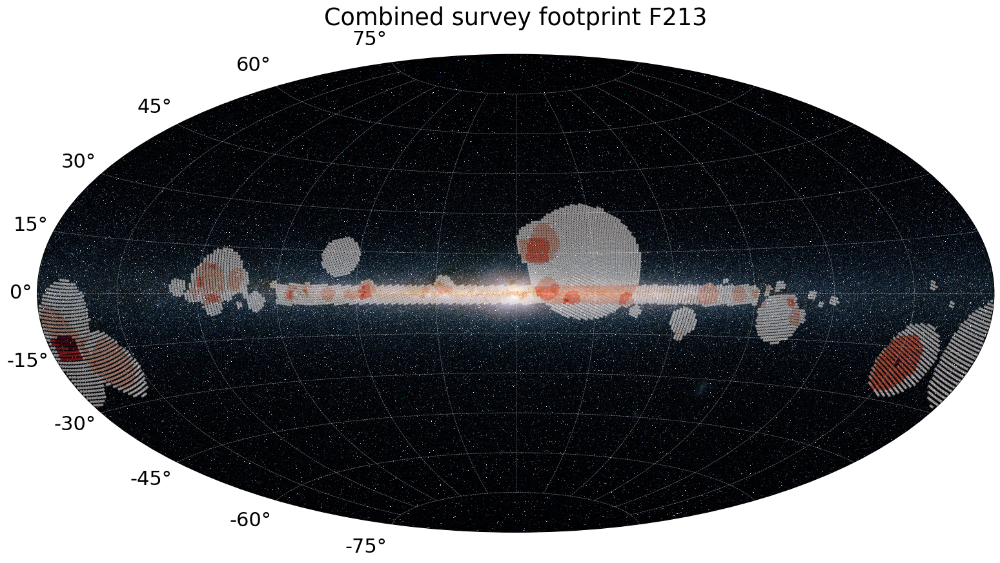

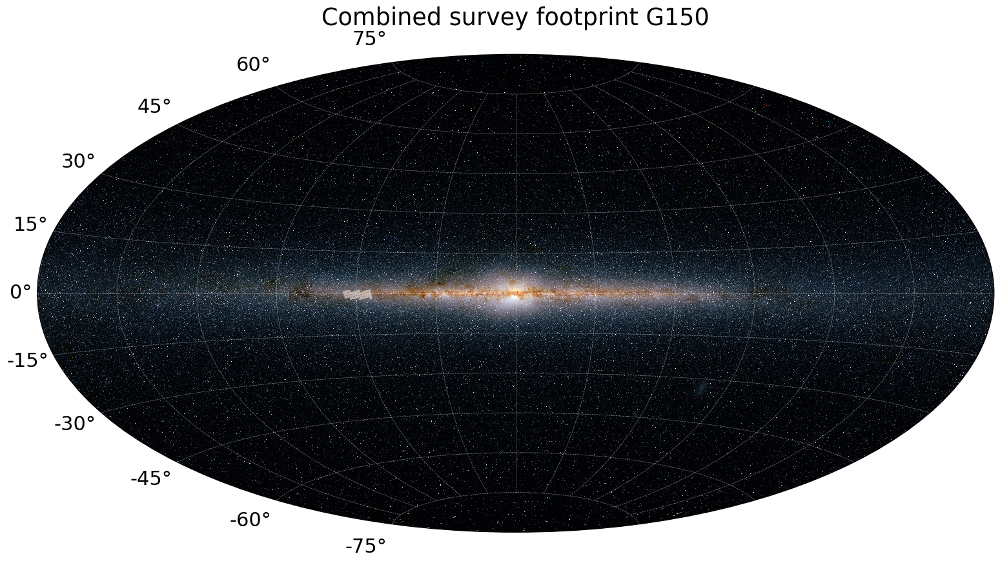

In [7]:
for optic, r_merge in combined_regions.items():
    mw1 = MWSkyMap(projection='aitoff', grayscale=False, grid='galactic', background='infrared', figsize=(16, 10))
    mw1.title = r_merge.label + ' ' + r_merge.optic
    s = r_merge.pixels_to_skycoords()
    mw1.scatter(s.ra.deg * u.deg, s.dec.deg * u.deg, c=r_merge.region_map[r_merge.pixels], cmap='Reds', s=5, alpha=0.4)
    plt.rcParams.update({'font.size': 22})

    plt.tight_layout()
    plt.savefig(path.join(root_dir, 'survey_maps', 'survey_map_'+r_merge.optic+'.png'))

These maps make it clear that the science cases request a range of different regions.  De Furio in particular provided a catalog of all known SFRs so that the survey can be optimized to include as many as possible.  However, this author also identified specific SFRs of particular interest.  The latter group therefore receive more "votes" in the maps and appear darker = higher priority. 

Other authors provided a small list of regions of particular interest.  These regions are co-added so that regions of interest for multiple science goals can easily be identified as HEALpixels with >1 vote.  These regions appear darker red in the maps above. 

We can therefore use these maps to calculate the areas of sky requested by more than one science case.

In [8]:
for optic, r in combined_regions.items():
    for threshold in range(2, int(r.region_map.max()), 1):
        idx = np.where(r.region_map >= float(threshold))[0]
        area = len(idx)*PIXAREA

        print(optic + ' -> Area requested by ' + str(threshold) + ' science case(s): ' + str(round(area,2)) + ' sq.deg.')

F129 -> Area requested by 2 science case(s): 976.94 sq.deg.
F129 -> Area requested by 3 science case(s): 276.13 sq.deg.
F158 -> Area requested by 2 science case(s): 145.2 sq.deg.
F184 -> Area requested by 2 science case(s): 781.38 sq.deg.
F213 -> Area requested by 2 science case(s): 1331.96 sq.deg.
F213 -> Area requested by 3 science case(s): 449.86 sq.deg.
F213 -> Area requested by 4 science case(s): 59.59 sq.deg.
